# Mini-Project Submission: Advanced Solution



# 1 Author

**Student Name**: Somil Parmar

# 2 Problem Formulation

Recognising gender from a voice recording can be useful in many applications, for example to separate users for further analysis. 

The problem involves building a machine learning pipeline to predict the gender of a participant, based on the hum interpretation type for various songs.

It will be interesting to see how well the models are able to predict gender, based on certain features extracted from the hum audio files.

Note: since the demographic data was not available at the time of writing this report, data was labelled manually. Gender was labeled using perceived differences in pitch (so may not be perfect in all cases).

# 3 Machine Learning Pipeline

The machine learning pipeline will involve the following stages:
1. Data ingestion (importing the raw data)
1. Data preprocessing (obtaining relevant labels)
1. Feature extraction
1. Model training
1. Candidate model evaluation

The output will be a song label ("False" for "Female" and "True" for "Male").

# 4 Transformation Stage

Following experimentation with 10 different features (see Appendix), three were selected for training of the model. These features are based primarily around pitch - natrually we could expect them to distinguish genders Reducing the features will help speed up computation time, enable us to reduce overfitting (as there should be less redundant data) and improve accuracy.

* Pitch mean and standard deviation - a property that orders sounds on a relative frequency scale (decribed as "lower" or "higher" notes). These features will allow us capture the average and variablity of the pitch.
* Chroma feature - this is a twelve element feature vector which indicates the amount of energy of each pitch class that are in each signal. As the features return a lot of values, we will be using the mean value.

As the features will have varying scales, thus we will use standardisation (using the Z-score) to ensure that inputs are treated equally. This will be done after splitting the data for building models.

Overall, our input will be the original audio files, from which we will extract the pitch mean, pitch std and chroma features.

# 5 Modelling

The following four supervised models will be implemented, all of which are suitable for classification problems:

1) Logistic regression
* This is used when the target variable is categorical, since linear regression (which is susceptible to outliers) would not be appropriate. Based on a threshold value, we can classify output into the two classes (Male or Female). We explore a range of values for the regularisation parameter (C) which helps to control overfitting (higher values give more weight to the training data).

2) Support vector machine (SVM)
* This method aims to find an optimal hyperplane boundary between our possible outputs (which maximises the distance to support vectors, unlike logistic regression). We explore a range of values for the regularisation parameter (C) - higher values lead to a smaller margin hyperplane.

3) K-Nearest Neighbours (kNN)
* This classification method determines the class of a data point by considering $k$ nearest points. It works differently to the above in that predictions are made based on the majority class amongst the $k$ nearest neighbours. We could expect audio files of the same class to be grouped together in the feature space, which is why we have chosen this model.
* A value of  $k$ that is too small is more likely to be sensitive to noise and can lead to overfitting. A value that is too large can cause generalisation and result in underfitting. We explore a range of values that does not include 1.


4) Gaussian Mixture Model (GMM)
*  We will fit this model to each of the male and female classes (assuming Gaussian distributions). This will enable us to obtain the likelihood of data points for each Gaussian distribution and compare them to obtain a classification.
* There are two parameters which we will adjust in these models - the number of components and covariance type.

# 6 Methodology

* Initially, the dataset will be randomly split into training and validation sets using a ratio of 70:30 respectively.

* We will perform hyperparameter tuning (using the training set only) on the logistic regression, SVM and kNN models using the grid search technique. This performs an exhaustive search on pre-defined parameters of a model, and computes the optimum values of the hyperparameters to give the best model performance. It also employs a K-Fold cross validator, similar to that explained below.

* Subsequently we will generate the training, validation accuracies and confusion matrices using the 70:30 split.

* The K-fold cross-validation procedure will also be used to estimate the performance of the first three models. This method will help to reduce the bias of the model skill, as it returns a mean of the model accuracies. We need to choose an appropriate value of $k$ such that each group is large enough to statistically represent the dataset. As we have over 1000 audio files, an appropriate value of $k$ could be 10. This will reserve 10% of the dataset for validation purposes.

* A slightly different procedure will be carried out for the GMM. In order to train this model, we will further "split" the same training/validation sets (used for the other models) into "Male" and "Female" classes (based on our labels). This is so that a GMM can be fit to each of the gender classes, and subsequently the log likelihood of a given recording for the respective GMM's will be compared. If the likelihood value for the 'true' gender is greater than the other, 1 is returned (otherwise 0). The accuracies will be obtained for each of the "Male" and "Female" validation sets.

* We will be using the Bayesian information criterion (BIC) to evaluate different values for the parameters discussed earlier (a lower score indicates a better model).

# 7 Dataset


## 7.1  Preparing the Dataset

We have chosen to use the respective "Part 1" zip folders for the 8 songs, since manual annotation of genders for both types would be time consuming (and more files would lengthen computation time). In addition, we can obtain a reasonable sample size from the part 1 files.

As shown below, there are 1667 audio files in total, across part 1 including hums and whistles recordings. However, we will be using only the hum recordings (the whistles will be excluded as we do not expect them to be useful for gender prediction).

In [ ]:
# Mount the drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
import os, sys, re, pickle, glob
import IPython.display as ipd
from tqdm import tqdm
import librosa
from sklearn.preprocessing import StandardScaler
%matplotlib inline

# Load the files
sample_path = '/content/drive/MyDrive/Data/MLEndAdvanced/*.wav'
files = glob.glob(sample_path)
len(files)

1667

The below code shows how we are able to extract 1288 of the audio files, which are labelled as hums. From exploring the file names in the directory, it was clear that the majority (if not all) "hum" files included this string (sometimes capitalised). We use this information to select all the hums data.

In [ ]:
# Creating a list and dataframe of all file_id's
files_table = []

for file in files:
  file_name = file.split('/')[-1]
  files_table.append([file_name])

files_df = pd.DataFrame(files_table,columns=['file_id'])

# Obtaining the interpretation type; searching for "hum" and ignoring caps
def get_interpretation(row):
  if re.search("hum", row["file_id"], re.IGNORECASE):
    return "hum"
  else:
    return "whistle"

# Create a dataframe, selecting only those file_id's that contain hums
files_interpretation = files_df.assign(interpretation_type = files_df.apply(get_interpretation, axis=1))

files_interpretation = files_interpretation.set_index('file_id')
hums_df = files_interpretation.loc[files_interpretation['interpretation_type'] == 'hum']
hums_df

,interpretation_type
file_id,
S47_hum_1_pinkpanther.wav,hum
S24_hum_2_Panther.wav,hum
S16_hum_2_Panther.wav,hum
S5_hum_1_PinkPanther.wav,hum
S9_hum_4_Panther.wav,hum
...,...
S20_hum_2_Panther.wav,hum
S111_hum_4_Panther.wav,hum
S115_hum_2_Panther.wav,hum


From the above file_id's we will obtain the 'participant_id' which will be used to map our gender labels (since we assume that one participant has a single gender applicable to all their audio files).

In [ ]:
pd.options.mode.chained_assignment = None

# Create a list containing hums file_id's only
hums_full_id = []

for file in files:
  fileID = file.split('/')[-1]
  if files_interpretation.loc[fileID]['interpretation_type']=="hum":
    hums_full_id.append(file)

# Obtain the relevant participant ID's
participant_list = []

for file in hums_full_id:
  participant_ID = file.split('/')[-1].split('_')[0]
  participant_list.append(participant_ID)

hums_df['participant_id'] = participant_list
hums_df = hums_df.drop(['interpretation_type'], axis=1)

hums_df

,participant_id
file_id,
S47_hum_1_pinkpanther.wav,S47
S24_hum_2_Panther.wav,S24
S16_hum_2_Panther.wav,S16
S5_hum_1_PinkPanther.wav,S5
S9_hum_4_Panther.wav,S9
...,...
S20_hum_2_Panther.wav,S20
S111_hum_4_Panther.wav,S111
S115_hum_2_Panther.wav,S115


Using this new 'participant_id' column, we map our label dictionary (shown below) to the participant ID.

In [ ]:
# Dictionary of manually annotated participant ID's and genders
gender_labels_dict = {'S1': 'Male', 'S2': 'Male', 'S3': 'Male', 'S4': 'Female', 'S5': 'Female', 'S6': 'Male', 'S7': 'Female', 'S8': 'Female', 'S9': 'Male', 'S10': 'Male',
                      'S12': 'Male', 'S13': 'Male', 'S14': 'Female', 'S15': 'Male', 'S16': 'Female', 'S17': 'Female', 'S18': 'Male', 'S19': 'Female', 'S20': 'Female',
                      'S21': 'Male', 'S22': 'Male', 'S23': 'Male', 'S24': 'Female', 'S25': 'Female', 'S26': 'Female', 'S28': 'Male', 'S29': 'Female', 'S30': 'Male',
                      'S31': 'Male', 'S32': 'Male', 'S34': 'Male', 'S35': 'Male', 'S36': 'Male', 'S37': 'Male', 'S38': 'Male', 'S39': 'Male', 'S40': 'Female',
                      'S41': 'Male', 'S42': 'Female', 'S43': 'Female', 'S44': 'Male', 'S45': 'Male', 'S46': 'Female', 'S47': 'Female', 'S48': 'Male', 'S49': 'Female', 'S50': 'Male',
                      'S51': 'Female', 'S52': 'Female', 'S53': 'Male', 'S54': 'Male', 'S55': 'Male', 'S56': 'Female', 'S57': 'Female', 'S58': 'Male', 'S59': 'Male', 'S60': 'Male',
                      'S61': 'Female', 'S62': 'Female', 'S63': 'Male', 'S64': 'Male', 'S65': 'Female', 'S66': 'Male', 'S67': 'Male', 'S68': 'Male', 'S69': 'Male', 'S70': 'Male',
                      'S71': 'Female', 'S72': 'Male', 'S73': 'Female', 'S74': 'Male', 'S75': 'Female', 'S76': 'Female', 'S77': 'Male', 'S78': 'Male', 'S79': 'Female', 'S80': 'Male',
                      'S82': 'Female', 'S84': 'Male', 'S85': 'Male', 'S86': 'Female', 'S87': 'Male', 'S88': 'Male', 'S89': 'Female', 'S90': 'Male',
                      'S91': 'Male', 'S92': 'Male', 'S93': 'Male', 'S94': 'Male', 'S95': 'Male', 'S96': 'Male', 'S97': 'Male', 'S99': 'Male', 'S100': 'Male',
                      'S101': 'Female', 'S102': 'Male', 'S103': 'Male', 'S104': 'Female', 'S105': 'Male', 'S108': 'Male', 'S107': 'Male', 'S108': 'Male', 'S109': 'Male', 'S110': 'Female',
                      'S111': 'Female', 'S114': 'Male', 'S115': 'Male',  'S116': 'Male', 'S117': 'Female', 'S118': 'Male', 'S119': 'Male'}

# Obtain the gender of each participant, using the dictionary above
def get_gender(row):
  if row.participant_id in gender_labels_dict:
    return gender_labels_dict[row.participant_id]
  else:
    return 'None'

# Check all participants have been assigned a gender and check class balance
df_genders = hums_df.assign(gender = hums_df.apply(get_gender, axis=1))
df_genders.gender.value_counts()

Male      780
Female    508
Name: gender, dtype: int64

From the above value counts we can see that all participants were assigned a gender. A few samples for select participants have been displayed below to check if the 'correct' genders have been assigned. We can audibly confirm that these labels are correct.

In [ ]:
# Display a sample of audio files for 'verification' of labels
np.random.seed(0)
sample_files = np.random.randint(1287, size=5)

def display_sample_audio(sample_files):
  for i in sample_files:
    participant = hums_full_id[i].split('/')[-1].split('_')[0]
    print("Participant selected: ", participant)
    print("Gender label is: ", gender_labels_dict[participant])
    display(ipd.Audio(hums_full_id[i]))

display_sample_audio(sample_files)

Participant selected:  S105
Gender label is:  Male


Participant selected:  S26
Gender label is:  Female


Participant selected:  S24
Gender label is:  Female


Participant selected:  S90
Gender label is:  Male


Participant selected:  S86
Gender label is:  Female


Furthermore, the dataset is imbalanced (780 "Male" and 508 "Female"). We will balance the dataset by downsampling the "Male" class; 508 recordings will be randomly selected to ensure dataset balance. The dataset is now ready for feature extraction.

In [ ]:
# Select dataframe rows for each gender
female_only = df_genders[df_genders.gender == 'Female']
male_only = df_genders[df_genders.gender == 'Male']

# Randomly downsample the male dataframe to match female count
male_only_resample = male_only.sample(n=508, random_state=10)

# Create a new dataframe with balanced class labels
merged = pd.concat([female_only, male_only_resample])
merged.gender.value_counts()

Male      508
Female    508
Name: gender, dtype: int64

## 7.2 Feature Extraction

The following code extracts the three features for each of the audio files.

In [ ]:
# Feature extraction
def getPitch(x,fs,winLen=0.02):
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

def get_features(files, files_df):
  X = []
  y = []
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    if fileID in files_df.index:
      fs = None
      x, fs = librosa.load(file,sr=fs)
      f0, voiced_flag = getPitch(x,fs,winLen=0.02)

      pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
      pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
      chroma_stft = np.mean(librosa.feature.chroma_stft(y=x, sr=fs))
      
      yi = files_df.loc[fileID]['gender']=='Male'

      X.append([pitch_mean, pitch_std, chroma_stft])
      y.append(yi)
    
  return np.array(X), np.array(y)

X, y = get_features(hums_full_id, merged)

100%|██████████| 1288/1288 [49:54<00:00,  2.32s/it]


Since these features were extracted previously, they were saved to reduce computation time. We can confirm the shape of the data is correct.

In [ ]:
# Using numpy to save our features (already done)

# from numpy import asarray
# from numpy import savetxt

# savetxt('data_advanced_x2.csv', X, delimiter=',')
# savetxt('data_advanced_y2.csv', y, delimiter=',')

# Loading the csv files containing our data
from numpy import loadtxt
X = loadtxt('data_advanced_x2.csv', delimiter=',')
y = loadtxt('data_advanced_y2.csv', delimiter=',')

print("The shape of the predictor array is: ", X.shape)
print("The shape of the labels array is: ", y.shape)

The shape of the predictor array is:  (1016, 3)
The shape of the labels array is:  (1016,)


## 7.3 Visualising the Audio Files in Space

The 3D plot below shows the relative positions of the audio files, as given by the 3 features (note that they have not yet been normalised). The two classes do appear fairly well-separable, which may suggest that we can expect our models to perform well.

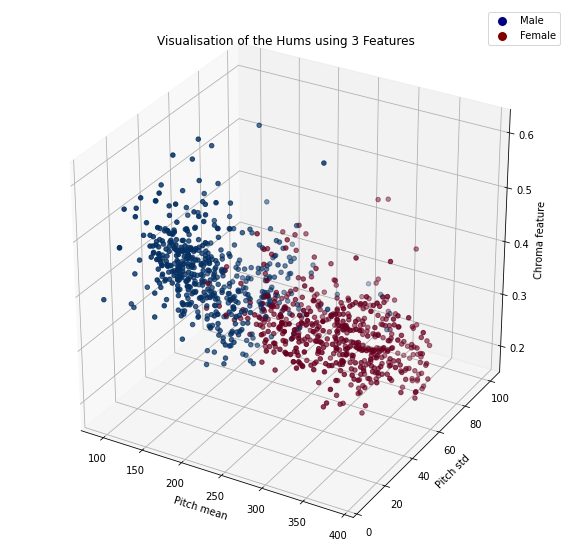

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

# Generate a dataframe with predictors and labels
features_df = pd.DataFrame(X)
features_labels = pd.concat((features_df, pd.DataFrame({'y': y})), axis=1)

# Plot the features
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(111, projection='3d')

colour_dict = {0:'r', 1:'b'}

ax1.scatter(features_labels.iloc[:, 0], features_labels.iloc[:, 1], features_labels.iloc[:, 2], c=features_labels['y'], cmap='RdBu')

ax1.set_title("Visualisation of the Hums using 3 Features")    
ax1.set_xlabel("Pitch mean")
ax1.set_ylabel("Pitch std")
ax1.set_zlabel("Chroma feature")

legend_elements = [Line2D([0],[0], marker='o', color='white', label='Male', markerfacecolor='navy', markersize=10),
                   Line2D([0],[0], marker='o', color='white', label='Female', markerfacecolor='maroon', markersize=10)]


ax1.legend(handles=legend_elements, loc='upper right')

# 8 Results

The data is split 70:30, using stratification to ensure balance of the labels in the training and validation sets. We then normalise predictors using the standard scaler.

## 8.1 Logistic Regression

The results of fitting the logistic regression model are as follows. We first explore different values of C using the grid search method.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.mixture import GaussianMixture as GMM
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

# Split the dataset, stratify by label y to ensure balance
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

# Standardise the train and validation features
sc = StandardScaler()
X_train_norm = sc.fit_transform(X_train)
X_val_norm = sc.transform(X_val)

# Perform grid search on the X_train set for optimal value of C
pipeline_logreg = Pipeline([('scale', sc), ('estimator', LogisticRegression())])
params_grid_logreg = {'estimator__C': [0.001, 0.01, 0.1, 1, 2, 5, 10, 25, 50, 100]}
grid_logreg = GridSearchCV(pipeline_logreg, params_grid_logreg, cv=10)
grid_logreg.fit(X_train, y_train)

print('Best hyperparameter setting: {0}.'
 .format(grid_logreg.best_params_))

Best hyperparameter setting: {'estimator__C': 5}.


Training Accuracy 0.9324894514767933
Validation Accuracy 0.921311475409836


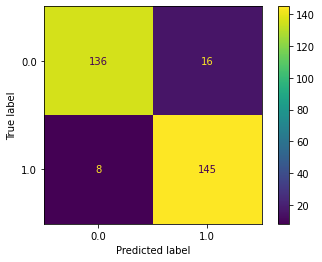

In [ ]:
# Fit the model to the training set using the best hyperparameter
logreg = LogisticRegression(C=5)
logreg.fit(X_train_norm, y_train)

# Obtain predictions
yt_pred=logreg.predict(X_train_norm)
yv_pred=logreg.predict(X_val_norm)

print('Training Accuracy', np.mean(yt_pred==y_train))
print('Validation Accuracy', np.mean(yv_pred==y_val))

# Generate confusion matrix for the validation set
ConfusionMatrixDisplay.from_predictions(y_val, yv_pred)

The logisitic regression model performs well. The validation accuracy is approximately 92%, which is slightly lower than the training accuracy, demonstrating that major overfitting has not occurred.

The vast majority of all female ("True label": 0) and male ("True label": 1) are correctly classified as their true labels. However, we can see that proportionately, more of the females (16/152) are misclassified compared to males (8/153).

## 8.2 Support Vector Machine

We will now fit the SVM model. First, we use the grid search method to find an optimal value of C.

In [ ]:
# Perform grid search on the X_train set for optimal value of C
pipeline_svm = Pipeline([('scale', sc), ('estimator', svm.SVC())])
params_grid_svc = {'estimator__C': [0.001, 0.01, 0.1, 1, 2, 5, 10, 25, 50, 100]}
grid_svc = GridSearchCV(pipeline_svm, params_grid_svc, cv=10)
grid_svc.fit(X_train, y_train)

print('Best hyperparameter setting: {0}.'
 .format(grid_svc.best_params_))

Best hyperparameter setting: {'estimator__C': 10}.


Training Accuracy 0.9423347398030942
Validation Accuracy 0.940983606557377


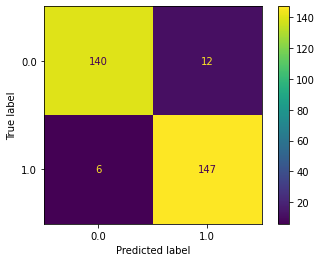

In [ ]:
# Fit the model to the training set using the best value of C
svc  = svm.SVC(C=10)
svc.fit(X_train_norm, y_train)

# Obtain predictions
yt_pred = svc.predict(X_train_norm)
yv_pred = svc.predict(X_val_norm)

print('Training Accuracy', np.mean(yt_pred==y_train))
print('Validation Accuracy', np.mean(yv_pred==y_val))

# Generate confusion matrix for the validation set
ConfusionMatrixDisplay.from_predictions(y_val, yv_pred)

The SVM performs better than the logistic regression model, based on the validation accuracy. Both the training and validation accuracies are similar, indicating that significant overfitting has not occurred.

Similarly to the logistic regression, we can see that the model classifies males better than females, since a smaller proportion of males (6/153 compared to 12/152 females) are misclassified.

## 8.3 k-Nearest Neighbours

We will now fit the kNN model, using the grid search method to find the optimal value of $k$.

In [ ]:
# Perform grid search on the X_train set for optimal value of k
pipeline_knn = Pipeline([('scale', sc), ('estimator', KNeighborsClassifier())])
params_grid_knn = {'estimator__n_neighbors': np.arange(2,21)}
knn_grid = GridSearchCV(pipeline_knn, params_grid_knn, cv=10)
knn_grid.fit(X_train, y_train)

print("The best value of k is: ", knn_grid.best_params_)

# Fit the model to the training set using the best value of k
knn = KNeighborsClassifier(n_neighbors=9)
knn.fit(X_train_norm, y_train)

The best value of k is:  {'estimator__n_neighbors': 9}


KNeighborsClassifier(n_neighbors=9)

Training Accuracy 0.9437412095639943
Validation  Accuracy 0.9475409836065574


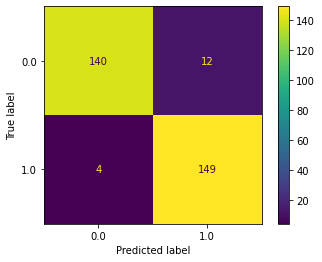

In [ ]:
# Obtain predictions using the best value of k
yt_pred = knn.predict(X_train_norm)
yv_pred = knn.predict(X_val_norm)

print('Training Accuracy', np.mean(yt_pred==y_train))
print('Validation  Accuracy', np.mean(yv_pred==y_val))

# Generate confusion matrix for the validation set
ConfusionMatrixDisplay.from_predictions(y_val, yv_pred)

The kNN model has a slightly higher validation accuracy than that of the two previous models. Once again, there is no indication of overfitting as the training and validation accuracies are very similar.

The confusion matrix indicates that relatively more of the female class (12/152 vs 4/153 male) is being misclassified compared to males.

## 8.4 K-Fold Cross-validation

The results above for all three models are specific to a particular 70:30 split of the data. In order to obtain a less biased result, we can use the K-Fold cross-validation technique (as described earlier). This will split the data into 10 folds, and each fold will be used for validation. The score returned is an average of all the model accuracies. Note that this method does not shuffle the data by default, so we have set this parameter to true.

In [ ]:
# Split the data into 10 folds, with shuffling
kf = KFold(10, shuffle=True, random_state=10)

# Ensure normalisation of the resulting train/validation sets and fit model using hyperparameters specified previously
pipeline_logreg = Pipeline([('transformer', sc), ('estimator', logreg)])
pipeline_svm = Pipeline([('transformer', sc), ('estimator', svc)])
pipeline_knn = Pipeline([('transformer', sc), ('estimator', knn)])

# Obtain the average accuracy across folds (using all X and y)
svc_score = cross_val_score(pipeline_svm, X, y, cv=kf)
logreg_score = cross_val_score(pipeline_logreg, X, y, cv=kf)
knn_score = cross_val_score(pipeline_knn, X, y, cv=kf)

print("Logistic Regression:", np.mean(logreg_score), ", SVM:", np.mean(svc_score), ", kNN:", np.mean(knn_score))

Logistic Regression: 0.9301397786837506 , SVM: 0.9389633080955155 , kNN: 0.9370025237817898


Comparing the validation accuracy of the 70:30 split to the results of K-fold above, we can see that the overall accuracies are lower. These differences may be expected, since the K-fold considers the average accuracy using many splits, as opposed to one.

It would seem that all three of these models perform similarly, with the SVM only performing very slightly better.

## 8.5 Gaussian Mixture Model

Using the same split of data, we can fit a GMM to each of the male and female classes. First, the training and validation sets are split into male and female classes. We then explore Bayesian information criterion scores using different parameters for the number of components and covariance type.

In [ ]:
import itertools
from scipy import linalg
import matplotlib as mpl
from sklearn import mixture

# Separating the training and validation data into male and female
def split_data(X_data, y_data):
  combined_df = pd.DataFrame(data=X_data)
  combined_df['y'] = y_data

  male_df = combined_df.loc[combined_df['y'] == True]
  female_df = combined_df.loc[combined_df['y'] == False]

  male_data = male_df[[0, 1, 2]].to_numpy()
  female_data = female_df[[0, 1, 2]].to_numpy()

  return male_data, female_data

X_train_males, X_train_females = split_data(X_train_norm, y_train)
X_val_males, X_val_females = split_data(X_val_norm, y_val)

print("The shape of male X_train data is: ", X_train_males.shape)
print("The shape of female X_train data is: ", X_train_females.shape)

print("\nThe shape of male X_val data is: ", X_val_males.shape)
print("The shape of female X_val data is: ", X_val_females.shape)

The shape of male X_train data is:  (355, 3)
The shape of female X_train data is:  (356, 3)

The shape of male X_val data is:  (153, 3)
The shape of female X_val data is:  (152, 3)


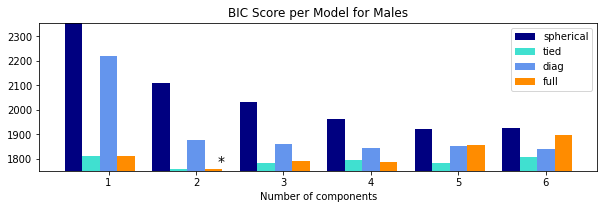

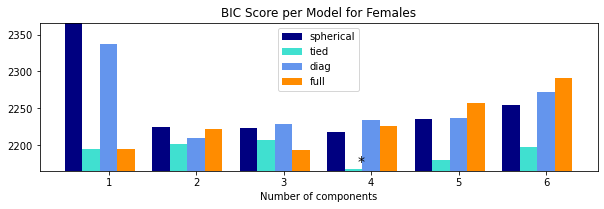

In [ ]:
# Fitting the GMM to each of the gender classes (training sets), using different values of n_components and covariance type
def gmm_model_selection(train_dataset, gender):
  lowest_bic = np.infty
  bic = []
  n_components_range = range(1, 7)
  cv_types = ["spherical", "tied", "diag", "full"]
  for cv_type in cv_types:
      for n_components in n_components_range:
          # Fit a Gaussian mixture with EM
          gmm = mixture.GaussianMixture(
              n_components=n_components, covariance_type=cv_type, random_state=1
          )
          gmm.fit(train_dataset)
          bic.append(gmm.bic(train_dataset))
          if bic[-1] < lowest_bic:
              lowest_bic = bic[-1]
              best_gmm = gmm

  bic = np.array(bic)
  color_iter = itertools.cycle(["navy", "turquoise", "cornflowerblue", "darkorange"])
  clf = best_gmm
  bars = []

  # Plot the BIC scores
  plt.figure(figsize=(10, 6))
  spl = plt.subplot(2, 1, 1)
  for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
      xpos = np.array(n_components_range) + 0.2 * (i - 2)
      bars.append(
          plt.bar(
              xpos,
              bic[i * len(n_components_range) : (i + 1) * len(n_components_range)],
              width=0.2,
              color=color,
          )
      )
  plt.xticks(n_components_range)
  plt.ylim([bic.min() * 1.01 - 0.01 * bic.max(), bic.max()])
  plt.title(f"BIC Score per Model for {gender}")
  xpos = (
      np.mod(bic.argmin(), len(n_components_range))
      + 0.65
      + 0.2 * np.floor(bic.argmin() / len(n_components_range))
  )
  plt.text(xpos, bic.min() * 0.97 + 0.03 * bic.max(), "*", fontsize=14)
  spl.set_xlabel("Number of components")
  spl.legend([b[0] for b in bars], cv_types)

gmm_model_selection(X_train_males, 'Males')
gmm_model_selection(X_train_females, 'Females')

From the above we can see that the "best" parameters for the male gmm model are 2 components and "full" covariance (as this results in the lowest BIC score). Whereas, for the female gmm model this is 4 components with "tied" covariance. Note that these results can fluctuate and are only specific to a random state.

These are the parameters we will use to train the models below, and subsequently report the accuracies on.

In [ ]:
# Train the model using the parameters identified previously
gmm_male = GMM(n_components = 2, covariance_type="full", random_state=1)
gmm_male.fit(X_train_males)

gmm_female = GMM(n_components = 4, covariance_type="tied", random_state=1)
gmm_female.fit(X_train_females)

# Function to predict class labels based on log likelihood
def calculate_accuracy(data, gender):
  output = []
  for f in data:

      log_likelihood_male = gmm_male.score([f])
      log_likelihood_female = gmm_female.score([f])
      
      if gender == 'male':
        if log_likelihood_male > log_likelihood_female:
            output.append(1)
        else:
            output.append(0)
      
      else:
        if log_likelihood_female > log_likelihood_male:
            output.append(1)
        else:
            output.append(0)

  accuracy = sum(output)/len(output)
  return accuracy

# Calculate the accuracies for male, female and their average
accuracy_male_train = calculate_accuracy(X_train_males, 'male')
accuracy_male_val = calculate_accuracy(X_val_males, 'male')

accuracy_female_train = calculate_accuracy(X_train_females, 'female')
accuracy_female_val = calculate_accuracy(X_val_females, 'female')

print("The accuracy for the male train set is: ", accuracy_male_train)
print("The accuracy for the male validation set is: ", accuracy_male_val)

print("\nThe accuracy for the female train set is: ", accuracy_female_train)
print("The accuracy for the female validation set is: ", accuracy_female_val)

print("\nThe average accuracy for the train sets is: ", (accuracy_male_train + accuracy_female_train) / 2)
print("The average accuracy for the validation sets is: ", (accuracy_male_val + accuracy_female_val) / 2)

The accuracy for the male train set is:  0.9577464788732394
The accuracy for the male validation set is:  0.9607843137254902

The accuracy for the female train set is:  0.9044943820224719
The accuracy for the female validation set is:  0.8881578947368421

The average accuracy for the train sets is:  0.9311204304478556
The average accuracy for the validation sets is:  0.9244711042311662


Based on the overall (average) validation accuracy of the GMM models, we can see that it performs very slightly worse than the models seen previously. Looking at the results for each gender, we can see that better predictions are made for males, which has a higher validation accuracy. Neither of the models show significant overfitting.

# 9 Conclusions

The findings of our experiments are summarised below:
* Overall, all of the models fitted perform well, demonstrating validation accuracies close to 90%.
* We can see that the SVM performs slightly better than the other models, with a K-Fold cross validation accuracy of 93.9%.
* Whilst the results appear promising, we must consider that the model has only been trained on hum audio files; we could not expect it to perform as well for gender identification in speech, for example.

Going forward, the focus should be on:
* There is a general trend that females tend to be misclassified compared to males (or males are better classified). We could explore these misclassifications and perhaps tweak features/model parameters to reduce them.
* Despite the high accuracies, there is still some room for improvement. Liaising with audio 'domain experts' may be helpful to direct appropriate pre-processing and feature extraction from data, such that any models built could better distinguish between the two classes.

# Appendix

Below is the code showing how the random forest model was utilised to determine feature importance. We experimented with some features in the starter kit, as well as 6 additional features.

Note that this feature extraction would be lengthy to execute for the entire dataset, hence experimentation was only carried out for a portion of the dataset (100 samples). We assume that this will be somewhat representative of the dataset.

First, we randomly select 100 files (50 male and 50 female).

In [ ]:
female_only_sample = female_only.sample(n=50, random_state=10)
male_only_sample = male_only.sample(n=50, random_state=10)

merged_sample = pd.concat([female_only_sample, male_only_sample])
merged_sample.gender.value_counts()

Female    50
Male      50
Name: gender, dtype: int64

The below functions extract all of the experimental features:

In [ ]:
def getPitch(x,fs,winLen=0.02):
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

def get_features_exp(files, files_df):
  X = []
  y = []
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    if fileID in files_df.index:
      fs = None
      x, fs = librosa.load(file,sr=fs)
      f0, voiced_flag = getPitch(x,fs,winLen=0.02)

      power = np.sum(x**2)/len(x)
      pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
      pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
      voiced_fr = np.mean(voiced_flag)

      chroma_stft = np.mean(librosa.feature.chroma_stft(y=x, sr=fs))
      spec_cent = np.mean(librosa.feature.spectral_centroid(y=x, sr=fs))
      spec_bw = np.mean(librosa.feature.spectral_bandwidth(y=x, sr=fs))
      rolloff = np.mean(librosa.feature.spectral_rolloff(y=x, sr=fs))
      zcr = np.mean(librosa.feature.zero_crossing_rate(x))
      mfcc = np.mean(librosa.feature.mfcc(y=x, sr=fs))
      
      yi = files_df.loc[fileID]['gender']=='Male'

      X.append([power,pitch_mean,pitch_std,voiced_fr,chroma_stft, spec_cent, spec_bw, rolloff, zcr, mfcc])
      y.append(yi)
    
  return np.array(X), np.array(y)

X_exp, y_exp = get_features_exp(hums_full_id, merged_sample)

100%|██████████| 1288/1288 [05:23<00:00,  3.98it/s]


The random forest classifier is one method to determine feature importance for the 100 samples. We can see that the pitch_mean, pitch_std and chroma_stft have the greatest importance. These will be used to train our models.

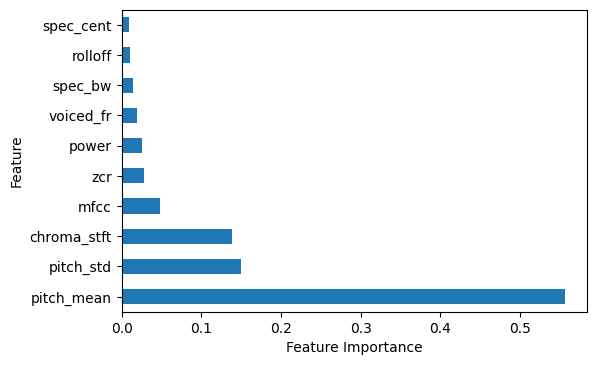

In [ ]:
sc_exp = StandardScaler()
exp_X_norm = sc_exp.fit_transform(X_exp)

from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()
rfc.fit(exp_X_norm, y_exp)

col_names = ['power','pitch_mean','pitch_std','voiced_fr','chroma_stft','spec_cent','spec_bw','rolloff','zcr','mfcc']

importance = rfc.feature_importances_

plt.figure(dpi=100)
feat_importances = pd.Series(rfc.feature_importances_, index=col_names)
feat_importances.nlargest(10).plot(kind='barh')
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.show()